# Librairies

In [81]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import contextlib

from src.preprocessing import apply_transformation
import statsmodels.api as sm
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

from src.pxl_em import *

#  Data

In [82]:
# Main data
fred_md = pd.read_csv("../data/fred_md_2024_12.csv")
# Metadata
fred_info = pd.read_csv("../data/FRED_MD_updated_appendix.csv", encoding="latin1")
# Recession variable
us_rec = pd.read_csv("../data/USREC.csv")
# Sparse factors data
factors = pd.read_csv('../results/sparse_factor/estimated_factor.csv', index_col='sasdate')

# Data Processing

We construct the dataset by taking all the variables from 1960 to 2024 and applying the transformations indicated in the metadata

In [83]:
#Indexing the dataset with dates
fred_md_short = (
    fred_md.iloc[1:]
    .assign(sasdate=pd.to_datetime(fred_md.iloc[1:].sasdate, format="%m/%d/%Y"))
    .set_index("sasdate")
)

#Transformation of series based on metadata
for _, row in fred_info.iterrows():
    series_name = row['fred']
    transformation_code = row['tcode']

    with contextlib.suppress(Exception):
        fred_md_short[series_name] = apply_transformation(fred_md_short[series_name], transformation_code)

#Filtering data by date
start_date = "1960"
end_date = "2024"
fred_md_short = fred_md_short[
    (fred_md_short.index >= start_date) & (fred_md_short.index <= end_date)
].dropna(axis=1)

#Addition of the variable of interest (American recession)
us_rec = us_rec.assign(
    observation_date=pd.to_datetime(us_rec.observation_date)
).set_index("observation_date")
us_rec = us_rec.loc[fred_md_short.index,:]

# PCA

We represent the number of principal components as a function of the explained variance. Then we construct three datasets using PCA by taking 60%, 80% and 90% of explained variance

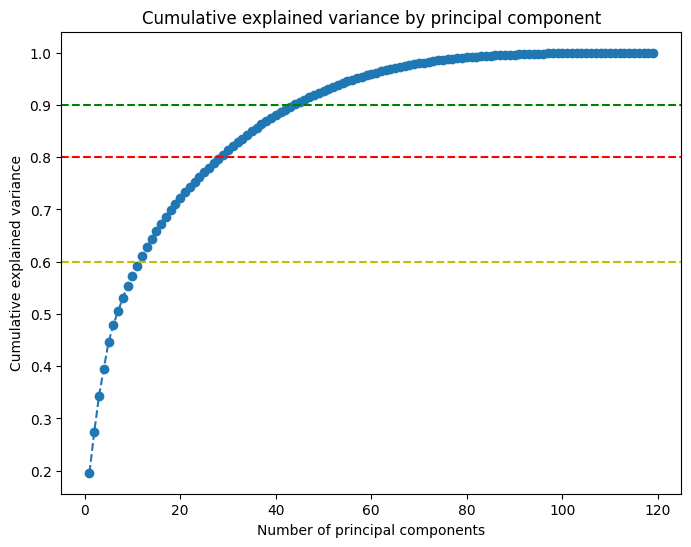

Number of components for 60% explained variance : 12
Number of components for 80% explained variance : 29
Number of components for 90% explained variance : 44


In [84]:
#Normalization of data
scaler = StandardScaler()
fred_md_scaled = scaler.fit_transform(fred_md_short)

#Apply PCA without specifying the number of components (to obtain all components)
pca = PCA()
pca.fit(fred_md_scaled)

#Calculate the variance explained by each component
explained_variance = pca.explained_variance_ratio_

#Plot cumulative explained variance
cumulative_variance = explained_variance.cumsum()

plt.figure(figsize=(8, 6))
plt.plot(range(1, len(explained_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.title("Cumulative explained variance by principal component")
plt.xlabel("Number of principal components")
plt.ylabel("Cumulative explained variance")
plt.axhline(y=0.60, color='y', linestyle='--')  #Line for 60% variance explained
plt.axhline(y=0.80, color='r', linestyle='--')  #Line for 80% variance explained
plt.axhline(y=0.90, color='g', linestyle='--')  #Line for 90% variance explained
plt.show()

# Find the number of components for 60%, 80%, and 90% explained variance
optimal_components_60 = (cumulative_variance >= 0.60).argmax() + 1
optimal_components_80 = (cumulative_variance >= 0.80).argmax() + 1
optimal_components_90 = (cumulative_variance >= 0.90).argmax() + 1
print(f"Number of components for 60% explained variance : {optimal_components_60}")
print(f"Number of components for 80% explained variance : {optimal_components_80}")
print(f"Number of components for 90% explained variance : {optimal_components_90}")

In [85]:
# Apply PCA with these numbers of components
pca_60 = PCA(n_components=optimal_components_60)
pca_80 = PCA(n_components=optimal_components_80)
pca_90 = PCA(n_components=optimal_components_90)

# Transform data with these PCAs
pca_60_components = pca_60.fit_transform(fred_md_scaled)
pca_80_components = pca_80.fit_transform(fred_md_scaled)
pca_90_components = pca_90.fit_transform(fred_md_scaled)

# Convert results to DataFrame
pca_60_df = pd.DataFrame(pca_60_components, columns=[f'PC{i+1}' for i in range(optimal_components_60)])
pca_80_df = pd.DataFrame(pca_80_components, columns=[f'PC{i+1}' for i in range(optimal_components_80)])
pca_90_df = pd.DataFrame(pca_90_components, columns=[f'PC{i+1}' for i in range(optimal_components_90)])

# Put the 'date' index for each PCA DataFrame
pca_60_df.index = fred_md_short.index
pca_80_df.index = fred_md_short.index
pca_90_df.index = fred_md_short.index

# Save each merged DataFrame as a CSV file, keeping the index
#pca_60_df.to_csv('/home/onyxia/work/Macroeconometrics/data/PCA/pca_60.csv', index=True)
#pca_80_df.to_csv('/home/onyxia/work/Macroeconometrics/data/PCA/pca_80.csv', index=True)
#pca_90_df.to_csv('/home/onyxia/work/Macroeconometrics/data/PCA/pca_90.csv', index=True)

# Sparse Factor

### Normalization

In [86]:
fred_md_normal = fred_md_short.apply(lambda col: (col - col.mean()) / (col.std()))
fred_md_normal.plot(backend="plotly")

### Sparse Factor Estimation with PXL-EM algorithm 

Algorithm from Ročková, V., & George, E. I. (2016). Fast Bayesian Factor Analysis via Automatic Rotations to Sparsity. Journal of the American Statistical Association, 111(516), 1608–1622. https://doi.org/10.1080/01621459.2015.1100620

In [87]:
num_factor = 10
num_obs, num_var = fred_md_normal.shape

Y = fred_md_normal.to_numpy().T
B0 = np.random.rand(num_var, num_factor)
Sigma0 = np.ones(num_var)
Theta0 = np.ones(num_factor) / 2

history = map_estimation(B0, Sigma0, Theta0, Y, alpha=1/num_var, lambda0=20, lambda1=0.01, convergence_criterion=0.005, num_iter=1000)

PXL-EM:   0%|          | 0/1000 [00:06<?, ?iter/s]


KeyboardInterrupt: 

### Result

Text(0.5, 1.0, 'Heatmap Estimated Covariance')

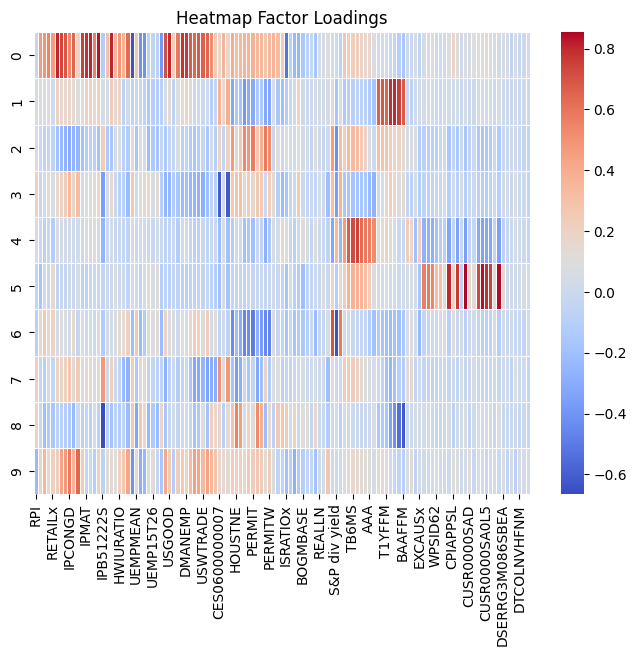

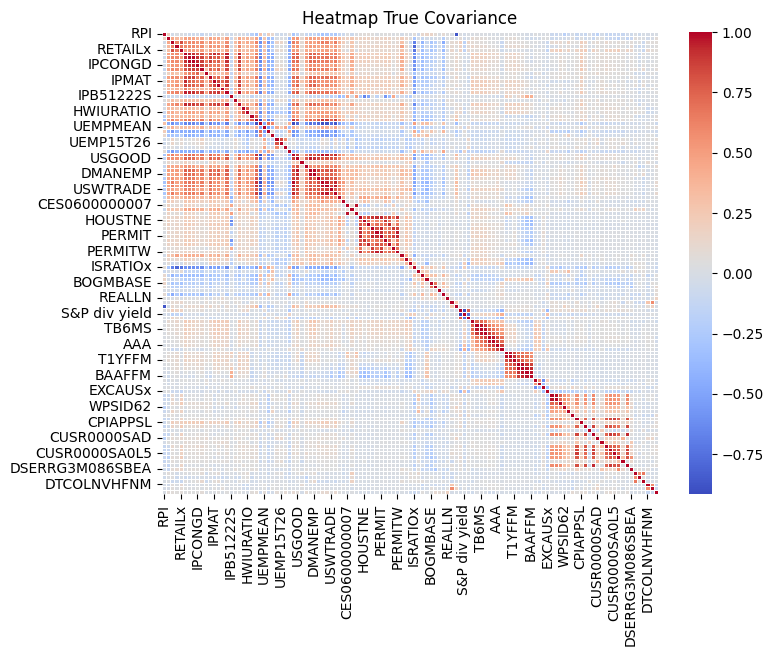

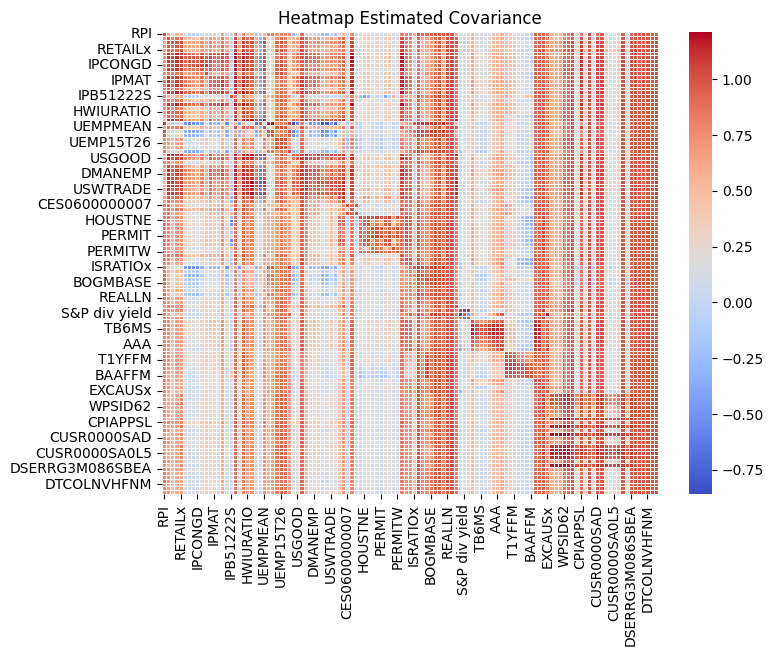

In [15]:
result = list(history.items())[-1]
B = result[1]["B"]
Sigma = result[1]["Sigma"]
Omega = result[1]["Omega"]

Loadings = pd.DataFrame(data=B.T, columns=fred_md_short.columns)
plt.figure(figsize=(8, 6))
sns.heatmap(Loadings, cmap="coolwarm", linewidths=0.5)
plt.title("Heatmap Factor Loadings")

true_cov = fred_md_normal.cov()
plt.figure(figsize=(8, 6))
sns.heatmap(true_cov, cmap="coolwarm", linewidths=0.5)
plt.title("Heatmap True Covariance")

covariance = pd.DataFrame(
    data=B @ B.T + Sigma, columns=fred_md_normal.columns, index=fred_md_normal.columns
)
plt.figure(figsize=(8, 6))
sns.heatmap(covariance, cmap="coolwarm", linewidths=0.5)
plt.title("Heatmap Estimated Covariance")

In [16]:
sparse_factor = pd.DataFrame(data=Omega.T, index=fred_md_normal.index).apply(
    lambda col: (col - col.mean()) / (col.std())
)
df_merged = pd.concat([sparse_factor, us_rec], axis=1)
sparse_factor.to_csv(
    "/Users/maximecoulet/CSENSAE/macroeconometrics/Macroeconometrics/results/sparse_factor/estimated_factor.csv"
)
df_merged.plot(backend="plotly")

# Logit Model

## 1. First estimation

### Data Standardization and variable selection

In [88]:
features_selected = ['RPI', 'CMRMTSPLx', 'UNRATE', 'USGOOD', 'AWHMAN', 'TB3SMFFM', 'CES0600000008', 'INDPRO', 'CUMFNS', 'S&P 500', 'ISRATIOx']
print("We consider the following features: ")
for feature in features_selected:
    print(f"{feature} : {fred_info[fred_info['fred']==feature]['description'].values[0]}")

We consider the following features: 
RPI : Real Personal Income
CMRMTSPLx : Real Manu.  and Trade Industries Sales
UNRATE : Civilian Unemployment Rate
USGOOD : All Employees:  Goods-Producing Industries
AWHMAN : Avg Weekly Hours :  Manufacturing
TB3SMFFM : 3-Month Treasury C Minus FEDFUNDS
CES0600000008 : Avg Hourly Earnings :  Goods-Producing
INDPRO : IP Index
CUMFNS : Capacity Utilization:  Manufacturing
S&P 500 : S&Ps Common Stock Price Index: Composite
ISRATIOx : Total Business:  Inventories to Sales Ratio


In [89]:
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(fred_md_short), columns=fred_md_short.columns, index=fred_md_short.index)

In [90]:
# Shift the X regressors
X_lagged = X_scaled.shift(1).dropna()
common_dates = X_lagged.index.intersection(us_rec.index)
X_lagged = X_lagged.loc[common_dates]
y = us_rec.loc[common_dates]

# Select the features selected
X_selected = X_lagged.loc[:,X_lagged.columns.isin(features_selected)]
X_selected_const = sm.add_constant(X_selected)

# Slit y and X in a train and test dataset
X_train, X_test, y_train, y_test = train_test_split(X_selected_const, y, test_size = 0.2, random_state=42)

### Model Fitting

In [91]:
logit_model = sm.Logit(y_train, X_train).fit()
logit_model.params

Optimization terminated successfully.
         Current function value: 0.192868
         Iterations 8


const           -3.379285
RPI             -0.054189
CMRMTSPLx       -0.574269
INDPRO          -0.591646
CUMFNS          -0.238333
UNRATE          -1.396893
USGOOD          -1.290082
AWHMAN          -0.997768
ISRATIOx        -0.547134
S&P 500         -0.599728
TB3SMFFM        -0.847970
CES0600000008    0.170125
dtype: float64

### Results

In [92]:
y_pred_prob = logit_model.predict(X_test)
y_pred = (y_pred_prob >= 0.5).astype(int)
print("Logit model:\n", classification_report(y_test, y_pred))

Logit model:
               precision    recall  f1-score   support

           0       0.95      0.98      0.96       139
           1       0.73      0.53      0.62        15

    accuracy                           0.94       154
   macro avg       0.84      0.76      0.79       154
weighted avg       0.93      0.94      0.93       154



The model is missing 47 % of the recession periods.

## 2. Weighted Loss and Regularization

Ridge regularization and penalization to misclassifed recessions

In [93]:
logit_model_l2 = LogisticRegression(solver='liblinear', penalty='l1', class_weight='balanced', C=1.0, max_iter=1000)
logit_model_l2.fit(X_train, y_train.values.ravel())

LogisticRegression(class_weight='balanced', max_iter=1000, penalty='l1',
                   solver='liblinear')

In [94]:
y_pred_l2 = logit_model_l2.predict(X_test)
print("L1 Regularization:\n", classification_report(y_test, y_pred_l2))

L1 Regularization:
               precision    recall  f1-score   support

           0       0.98      0.94      0.96       139
           1       0.59      0.87      0.70        15

    accuracy                           0.93       154
   macro avg       0.79      0.90      0.83       154
weighted avg       0.95      0.93      0.93       154



## 3. Logit on PCA factors

### 3.1 Import PCA Factors

In [95]:
# PCA
pca_60 = pd.read_csv('../results/PCA/pca_60.csv')
pca_80 = pd.read_csv('../results/PCA/pca_80.csv')
pca_90 = pd.read_csv('../results/PCA/pca_90.csv')

pca_60 = pca_60.assign(sasdate=pd.to_datetime(pca_60.sasdate)).set_index("sasdate")
pca_80 = pca_80.assign(sasdate=pd.to_datetime(pca_80.sasdate)).set_index("sasdate")
pca_90 = pca_90.assign(sasdate=pd.to_datetime(pca_90.sasdate)).set_index("sasdate")

In [96]:
pca_60_lagged = pca_60.shift(1).dropna()
pca_80_lagged = pca_80.shift(1).dropna()
pca_90_lagged = pca_90.shift(1).dropna()

common_index = pca_60_lagged.index.intersection(us_rec.index)
y = us_rec.loc[common_index]

### 3.2 PCA 60

In [97]:
X_train, X_test, y_train, y_test = train_test_split(pca_60_lagged, y, test_size=0.2, random_state=42, stratify=y)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

logit_model = LogisticRegression(solver='liblinear', class_weight='balanced', penalty='l1', max_iter=1000)
logit_model.fit(X_train_scaled, y_train.values.ravel())


LogisticRegression(class_weight='balanced', max_iter=1000, penalty='l1',
                   solver='liblinear')

In [98]:
coefficients = logit_model.coef_[0]
selected_pca_features = np.where(coefficients != 0)[0]
print("Selected PCA components:", selected_pca_features)

Selected PCA components: [ 0  1  2  3  4  5  6  7  8  9 10 11]


#### Results

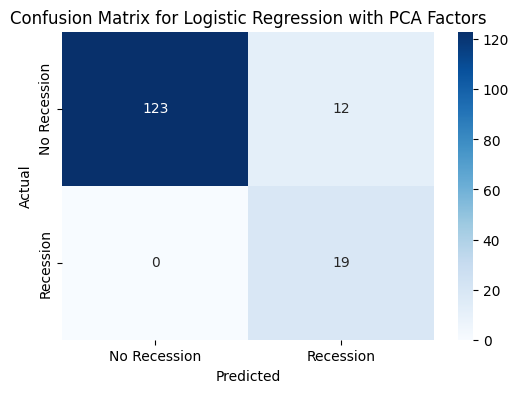

Logit PCA 60:
               precision    recall  f1-score   support

           0       1.00      0.91      0.95       135
           1       0.61      1.00      0.76        19

    accuracy                           0.92       154
   macro avg       0.81      0.96      0.86       154
weighted avg       0.95      0.92      0.93       154



In [99]:
y_pred = logit_model.predict(X_test_scaled)


# Confusion matrix
plt.figure(figsize=(6, 4))
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["No Recession", "Recession"], yticklabels=["No Recession", "Recession"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix for Logistic Regression with PCA Factors")
plt.show()

# Metrics
accuracy = accuracy_score(y_test, y_pred)
print("Logit PCA 60:\n", classification_report(y_test, y_pred))

### 3.3 PCA 80

In [100]:
X_train, X_test, y_train, y_test = train_test_split(pca_80_lagged, y, test_size=0.2, random_state=42, stratify=y)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

logit_model = LogisticRegression(solver='liblinear', max_iter=1000, penalty='l1', class_weight='balanced')
logit_model.fit(X_train_scaled, y_train.values.ravel())

coefficients = logit_model.coef_[0]
selected_pca_features = np.where(coefficients != 0)[0]
print("Number of selected PCA components:", len(selected_pca_features))

Number of selected PCA components: 28


#### Results

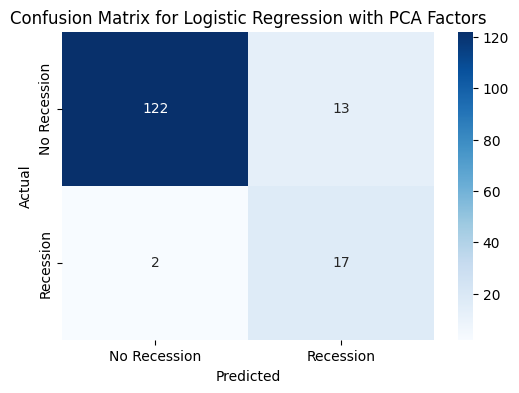

Logit PCA 80:
               precision    recall  f1-score   support

           0       0.98      0.90      0.94       135
           1       0.57      0.89      0.69        19

    accuracy                           0.90       154
   macro avg       0.78      0.90      0.82       154
weighted avg       0.93      0.90      0.91       154



In [101]:
y_pred = logit_model.predict(X_test_scaled)


# Confusion matrix
plt.figure(figsize=(6, 4))
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["No Recession", "Recession"], yticklabels=["No Recession", "Recession"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix for Logistic Regression with PCA Factors")
plt.show()

# Metrics
print("Logit PCA 80:\n", classification_report(y_test, y_pred))

### 3.4 PCA 90

In [102]:
X_train, X_test, y_train, y_test = train_test_split(pca_90_lagged, y, test_size=0.2, random_state=42, stratify=y)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

logit_model = LogisticRegression(solver='liblinear', class_weight='balanced', penalty='l1', max_iter=1000)
logit_model.fit(X_train_scaled, y_train.values.ravel())

coefficients = logit_model.coef_[0]
selected_pca_features = np.where(coefficients != 0)[0]
print("Number of selected PCA components:", len(selected_pca_features))


Number of selected PCA components: 42


#### Results

In [103]:
y_pred = logit_model.predict(X_test_scaled)
# Metrics
print("Logit PCA 90:\n", classification_report(y_test, y_pred))

Logit PCA 90:
               precision    recall  f1-score   support

           0       0.98      0.94      0.96       135
           1       0.67      0.84      0.74        19

    accuracy                           0.93       154
   macro avg       0.82      0.89      0.85       154
weighted avg       0.94      0.93      0.93       154



## 4. Logit on sparse factors

### Model Fitting

In [104]:
# Sparse factors
factors = pd.read_csv('../results/sparse_factor/estimated_factor.csv')
factors = factors.assign(sasdate=pd.to_datetime(factors.sasdate)).set_index("sasdate")

In [105]:
factors_lagged = factors.shift(1).dropna()

common_index = factors_lagged.index.intersection(us_rec.index)
y = us_rec.loc[common_index]

In [106]:
X_train, X_test, y_train, y_test = train_test_split(factors_lagged, y, test_size=0.2, random_state=42, stratify=y)

logit_model = LogisticRegression(solver='liblinear', class_weight='balanced', penalty='l1', max_iter=1000)
logit_model.fit(X_train, y_train.values.ravel())
coefficients = logit_model.coef_[0]
selected_pca_features = np.where(coefficients != 0)[0]
print("Number of selected PCA components:", len(selected_pca_features))

Number of selected PCA components: 10


### Results

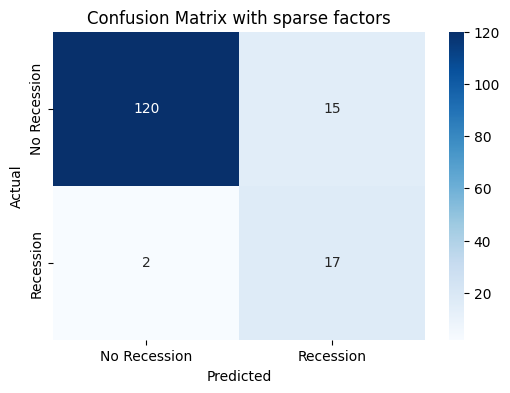

Logit estimated with Bayesian Sparse Factors:
               precision    recall  f1-score   support

           0       0.98      0.89      0.93       135
           1       0.53      0.89      0.67        19

    accuracy                           0.89       154
   macro avg       0.76      0.89      0.80       154
weighted avg       0.93      0.89      0.90       154



In [107]:
y_pred = logit_model.predict(X_test)


# Confusion matrix
plt.figure(figsize=(6, 4))
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["No Recession", "Recession"], yticklabels=["No Recession", "Recession"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix with sparse factors")
plt.show()

# Metrics
print("Logit estimated with Bayesian Sparse Factors:\n", classification_report(y_test, y_pred))

# Random Forest

We construct a function which takes as input the covariates X and the variable of interest y and which tunes the hyperparameters by cross-validation, then which trains the best model and which gives us metrics on the classification of the test sample

In [108]:
#Function Random Forest
def run_random_forest(X, y, param_grid=None, test_size=0.2, random_state=667, cv_folds=5):
    """
    Perform Random Forest classification with hyperparameter tuning using GridSearchCV.

    Parameters:
    X : Covariates (features) for training the model.
    y : Target variable for classification.
    param_grid : Dictionary of hyperparameters to tune.
    test_size : Fraction of data to use for testing (default is 0.2).
    random_state : Random seed for reproducibility (default is 42).
    cv_folds : Number of folds for cross-validation (default is 5).

    Returns:
    dict: Contains 'best_params', 'classification_report', 'accuracy', and 'feature_importance'.
    """
    # Standardize the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Split the data into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=test_size, random_state=random_state, stratify = y)

    # Instantiate Random Forest model
    rf = RandomForestClassifier(random_state=random_state)

    # Hyperparameter tuning
    if param_grid is None:
        param_grid = {
        'n_estimators': [1000],  # Number of trees in the forest
        'max_depth': [None, 10, 30],   #Maximum tree depth
        'min_samples_split': [2, 5, 10],   #Minimum number of samples to split a node
        'min_samples_leaf': [1, 4],     #Minimum number of samples per leaf
        }
    grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=cv_folds, n_jobs=-1, verbose=2)
    grid_search.fit(X_train, y_train)

    #Best model
    best_rf = grid_search.best_estimator_

    #Predictions on the test set
    y_pred = best_rf.predict(X_test)

    #Evaluation
    classification_rep = classification_report(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)

    #Feature importance
    importances = best_rf.feature_importances_
    feature_importance_df = pd.DataFrame({
        'Feature': X.columns if isinstance(X, pd.DataFrame) else [f'PC{i+1}' for i in range(X.shape[1])],
        'Importance': importances
    }).sort_values(by='Importance', ascending=False)

    # Return results
    return {
        'best_params': grid_search.best_params_,
        'classification_report': classification_rep,
        'accuracy': accuracy,
        'feature_importance': feature_importance_df
    }

## Random Forest with all covariates

In [ ]:
#We use the data in t-1 to predict a recession in t
fred_md_lagged = fred_md_short.shift(1)

#Merge lagged data with recession indicator
data = pd.concat([fred_md_lagged, us_rec], axis=1)

#Define variables X (features) and y (target)
X = data.drop(columns=['USREC'])  # Tout sauf 'us_rec' sera utilisé comme caractéristiques
y = data['USREC']  # La variable cible est 'us_rec'

#Run Random Forest with the custom function
results = run_random_forest(X, y)

# Display the results
print("Best Hyperparameters :", results['best_params'])
print("\nClassification Report:")
print(results['classification_report'])

Fitting 5 folds for each of 18 candidates, totalling 90 fits


[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=  20.5s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=  21.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=  23.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=  23.7s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=  23.9s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=  24.9s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=  25.6s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=  25.7s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=  13.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=1

## Random Forest with PCA

In [ ]:
#PCA datasets
pca_60_df = pd.read_csv('../results/PCA/pca_60.csv', index_col='sasdate')  # For 60% variance explained
pca_80_df = pd.read_csv('../results/PCA/pca_80.csv', index_col='sasdate')  # For 80% variance explained
pca_90_df = pd.read_csv('../results/PCA/pca_90.csv', index_col='sasdate')  # For 90% variance explained

pca_60_df.index = pd.to_datetime(pca_60_df.index)
pca_80_df.index = pd.to_datetime(pca_80_df.index)
pca_90_df.index = pd.to_datetime(pca_90_df.index)

In [ ]:
#We use the data in t-1 to predict a recession in t
pca_60_df = pca_60_df.shift(1)

#Merge lagged data with recession indicator
pca_60_df = pd.concat([pca_60_df, us_rec], axis=1, join='inner').dropna()

# Target variable is 'USREC', the recession indicator
X_60 = pca_60_df.drop(columns=['USREC'])
y_60 = pca_60_df['USREC']

#Run Random Forest with the custom function
results_60 = run_random_forest(X_60, y_60)

# Display the results for 60% explained variance
print("Best Hyperparameters for 60% Variance Explained:", results_60['best_params'])
print("\nClassification Report for 60% Variance Explained:")
print(results_60['classification_report'])

Fitting 5 folds for each of 18 candidates, totalling 90 fits
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=  37.9s[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=  37.9s

[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=  50.7s[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=  50.7s

[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=  50.9s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=  51.6s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=  52.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=  53.1s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5, n_estimators=1000; total time=  18.9s
[CV

In [11]:
#We use the data in t-1 to predict a recession in t
pca_80_df = pca_80_df.shift(1)

#Merge lagged data with recession indicator
pca_80_df = pd.concat([pca_80_df, us_rec], axis=1, join='inner').dropna()

# Target variable is 'USREC', the recession indicator
X_80 = pca_80_df.drop(columns=['USREC'])
y_80 = pca_80_df['USREC']

# Run Random Forest with the custom function
results_80 = run_random_forest(X_80, y_80)

# Display the results for 80% explained variance
print("Best Hyperparameters for 80% Variance Explained:", results_80['best_params'])
print("\nClassification Report for 80% Variance Explained:")
print(results_80['classification_report'])

Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best Hyperparameters for 80% Variance Explained: {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 1000}

Classification Report for 80% Variance Explained:
              precision    recall  f1-score   support

           0       0.93      0.99      0.96       135
           1       0.90      0.47      0.62        19

    accuracy                           0.93       154
   macro avg       0.92      0.73      0.79       154
weighted avg       0.93      0.93      0.92       154



In [12]:
#We use the data in t-1 to predict a recession in t
pca_90_df = pca_90_df.shift(1)

#Merge lagged data with recession indicator
pca_90_df = pd.concat([pca_90_df, us_rec], axis=1, join='inner').dropna()

# Target variable is 'USREC', the recession indicator
X_90 = pca_90_df.drop(columns=['USREC'])
y_90 = pca_90_df['USREC']

# Run Random Forest with the custom function
results_90 = run_random_forest(X_90, y_90)

# Display the results for 90% explained variance
print("Best Hyperparameters for 90% Variance Explained:", results_90['best_params'])
print("\nClassification Report for 90% Variance Explained:")
print(results_90['classification_report'])

Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best Hyperparameters for 90% Variance Explained: {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 1000}

Classification Report for 90% Variance Explained:
              precision    recall  f1-score   support

           0       0.93      0.99      0.96       135
           1       0.90      0.47      0.62        19

    accuracy                           0.93       154
   macro avg       0.92      0.73      0.79       154
weighted avg       0.93      0.93      0.92       154



## Random Forest with sparse factors

In [13]:
factors.index = pd.to_datetime(factors.index)

#We use the data in t-1 to predict a recession in t
factors = factors.shift(1)

#Merge lagged data with recession indicator
factors = pd.concat([factors, us_rec], axis=1, join='inner').dropna()

# Target variable is 'USREC', the recession indicator
X_factors = factors.drop(columns=['USREC'])
y_factors = factors['USREC']

# Run Random Forest with the custom function
results_factors = run_random_forest(X_factors, y_factors)

# Display the results
print("Best Hyperparameters:", results_factors['best_params'])
print("\nClassification Report:")
print(results_factors['classification_report'])

Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best Hyperparameters: {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 1000}

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.98      0.96       135
           1       0.80      0.63      0.71        19

    accuracy                           0.94       154
   macro avg       0.87      0.80      0.83       154
weighted avg       0.93      0.94      0.93       154



In [14]:
#We combine the sparse factors with all the covariates (fred_md_short)
factors = pd.read_csv('/home/onyxia/work/Macroeconometrics/data/estimated_factor.csv', index_col='sasdate')
factors.index = pd.to_datetime(factors.index)
data = pd.merge(factors, fred_md_short, left_index=True, right_index=True, how='inner')

#We use the data in t-1 to predict a recession in t
data = data.shift(1)

#Merge lagged data with recession indicator
data = pd.concat([data, us_rec], axis=1, join='inner').dropna()

# Target variable is 'USREC', the recession indicator
X = data.drop(columns=['USREC'])
y = data['USREC']

# Run Random Forest with the custom function
results = run_random_forest(X, y)

# Display the results
print("Best Hyperparameters:", results['best_params'])
print("\nClassification Report:")
print(results['classification_report'])

Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best Hyperparameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 1000}

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.96       135
           1       0.85      0.58      0.69        19

    accuracy                           0.94       154
   macro avg       0.89      0.78      0.83       154
weighted avg       0.93      0.94      0.93       154

